In [1]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
from skimage.metrics import peak_signal_noise_ratio, structural_similarity

def plot_intensity_profile(gt_path, noisy_path, pred_path, show_images=True):
    # Đọc ảnh và chuyển sang grayscale
    gt = cv2.imread(gt_path, cv2.IMREAD_GRAYSCALE)
    noisy = cv2.imread(noisy_path, cv2.IMREAD_GRAYSCALE)
    pred = cv2.imread(pred_path, cv2.IMREAD_GRAYSCALE)

    # Resize nếu cần
    if gt.shape != pred.shape:
        print("⚠️ Resize predicted image to match ground truth.")
        pred = cv2.resize(pred, (gt.shape[1], gt.shape[0]))

    if gt.shape != noisy.shape:
        print("⚠️ Resize noisy image to match ground truth.")
        noisy = cv2.resize(noisy, (gt.shape[1], gt.shape[0]))

    # Tính PSNR và SSIM
    psnr = peak_signal_noise_ratio(gt, pred, data_range=255)
    ssim = structural_similarity(gt, pred, data_range=255)

    psnr2 = peak_signal_noise_ratio(gt, noisy, data_range=255)
    ssim2 = structural_similarity(gt, noisy, data_range=255)

    # Lấy dòng giữa ảnh
    row = gt.shape[0] // 2
    x = np.arange(gt.shape[1])
    gt_line = gt[row, :]
    noisy_line = noisy[row, :]
    pred_line = pred[row, :]

    # Vẽ biểu đồ
    fig, axs = plt.subplots(2, 3, figsize=(15, 8))

    if show_images:
        axs[0, 0].imshow(gt, cmap='gray')
        axs[0, 0].set_title("Ground Truth")
        axs[0, 0].axis('off')

        axs[0, 1].imshow(noisy, cmap='gray')
        axs[0, 1].set_title(f"Noisy Image\nPSNR: {psnr2:.2f}, SSIM: {ssim2:.2f}")
        axs[0, 1].axis('off')

        axs[0, 2].imshow(pred, cmap='gray')
        axs[0, 2].set_title(f"Predicted\nPSNR: {psnr:.2f}, SSIM: {ssim:.2f}")
        axs[0, 2].axis('off')

    axs[1, 0].plot(x, gt_line, 'b--', label='GT')
    axs[1, 0].set_title("GT Profile")
    axs[1, 0].set_xlabel("X Direction")
    axs[1, 0].set_ylabel("Intensity")
    axs[1, 0].set_ylim([0, 260])
    axs[1, 0].legend()

    axs[1, 1].plot(x, gt_line, 'b--', label='GT')
    axs[1, 1].plot(x, noisy_line, 'r--', label='Noisy')
    axs[1, 1].set_title("Noisy vs GT Profile")
    axs[1, 1].set_xlabel("X Direction")
    axs[1, 1].set_ylabel("Intensity")
    axs[1, 1].set_ylim([0, 260])
    axs[1, 1].legend()

    axs[1, 2].plot(x, gt_line, 'b--', label='GT')
    axs[1, 2].plot(x, pred_line, 'k--', label='Predicted')
    axs[1, 2].set_title("Predicted vs GT Profile")
    axs[1, 2].set_xlabel("X Direction")
    axs[1, 2].set_ylabel("Intensity")
    axs[1, 2].set_ylim([0, 260])
    axs[1, 2].legend()

    plt.tight_layout()
    plt.show()


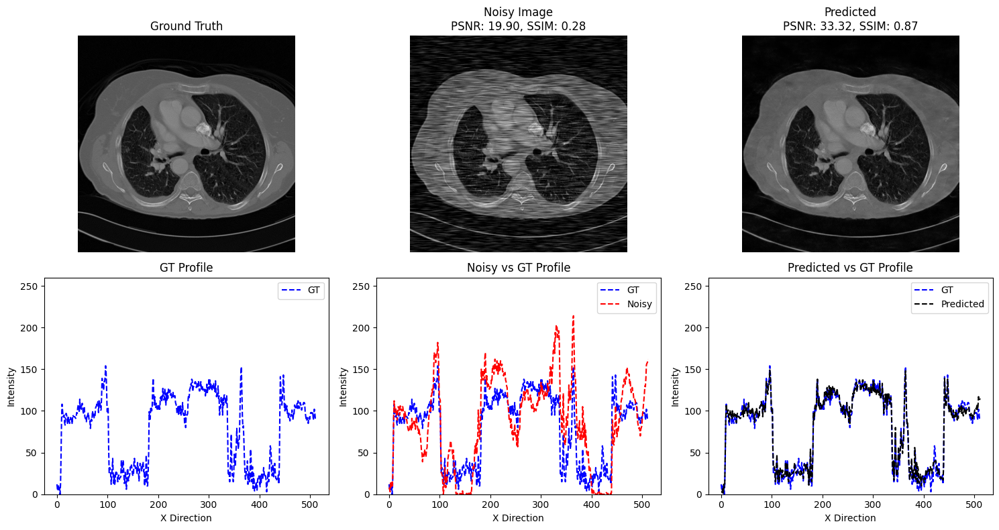

In [6]:
plot_intensity_profile(
"/home/duongnhan/Chon/data/ketqua/test30/gt/ID_0032_g1.jpg", 
"/home/duongnhan/Chon/data/ketqua/test30/noisy/ID_0032_g1.jpg", 
"/home/duongnhan/Chon/data/ketqua/test30/result/ID_0032_g1.jpg")


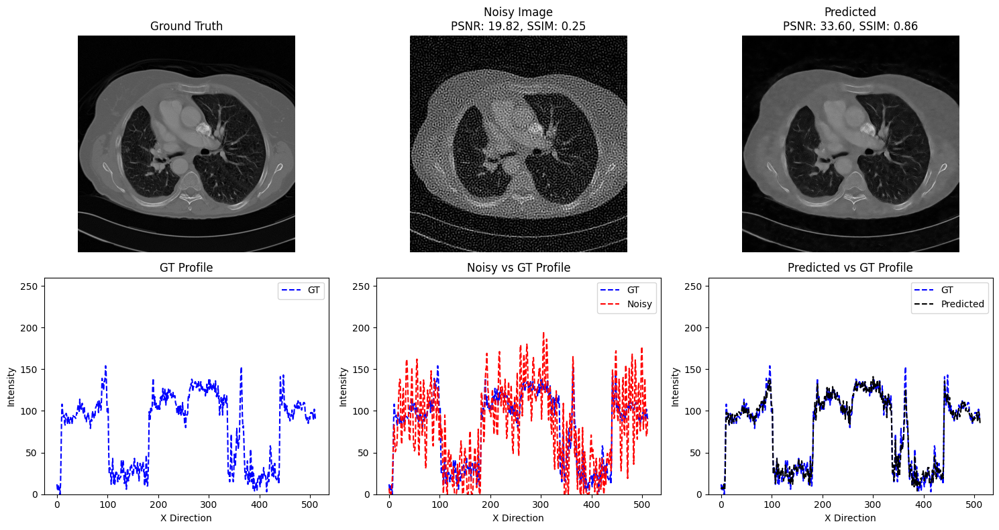

In [7]:
plot_intensity_profile(
"/home/duongnhan/Chon/data/ketqua/test30/gt/ID_0032_g2.jpg", 
"/home/duongnhan/Chon/data/ketqua/test30/noisy/ID_0032_g2.jpg", 
"/home/duongnhan/Chon/data/ketqua/test30/result/ID_0032_g2.jpg")


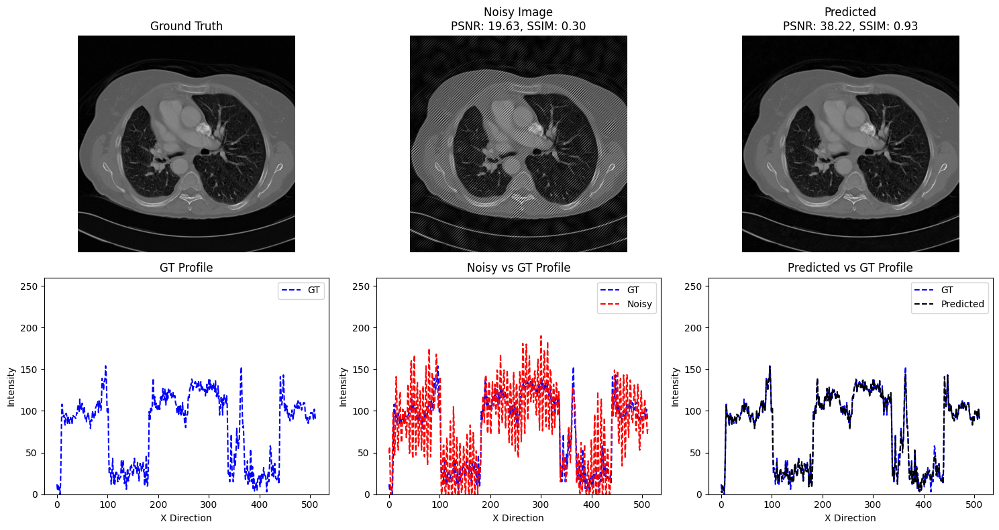

In [10]:
plot_intensity_profile(
"/home/duongnhan/Chon/data/ketqua/test30/gt/ID_0032_g3.jpg", 
"/home/duongnhan/Chon/data/ketqua/test30/noisy/ID_0032_g3.jpg", 
"/home/duongnhan/Chon/data/ketqua/test30/result/ID_0032_g3.jpg")


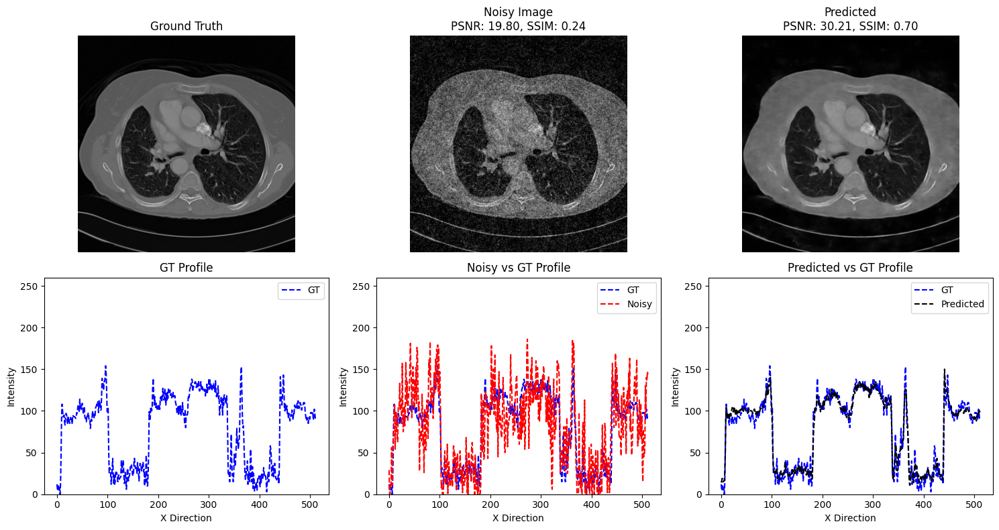

In [11]:
plot_intensity_profile(
"/home/duongnhan/Chon/data/ketqua/test30/gt/ID_0032_g4.jpg", 
"/home/duongnhan/Chon/data/ketqua/test30/noisy/ID_0032_g4.jpg", 
"/home/duongnhan/Chon/data/ketqua/test30/result/ID_0032_g4.jpg")


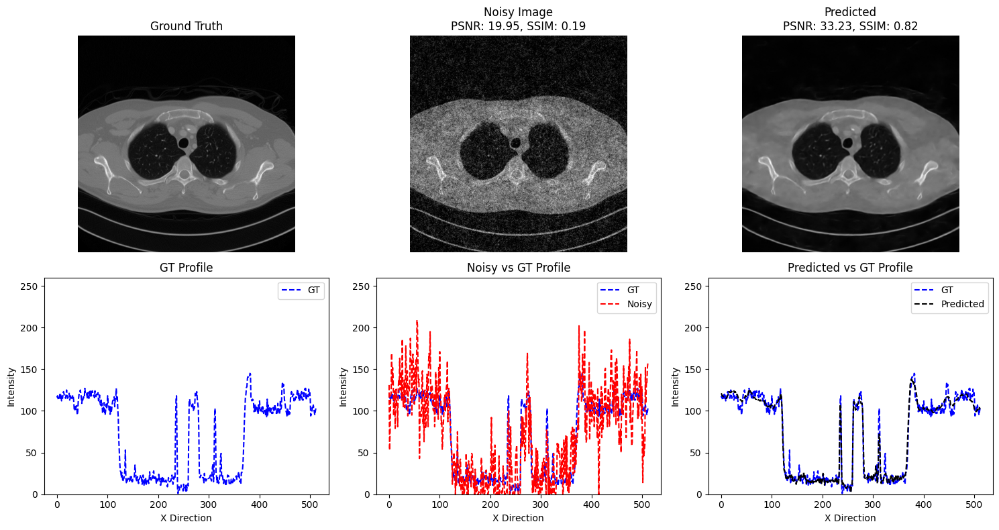

In [3]:
plot_intensity_profile(
"/home/duongnhan/Chon/data/result_test/test_300_range3/level_30/gt/ID_0033_g4.jpg", 
"/home/duongnhan/Chon/data/test_200/30/input/ID_0033_g4.jpg", 
"/home/duongnhan/Chon/data/result_test/test_300_range3/level_30/input/ID_0033_g4.jpg")


In [12]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
from skimage.metrics import peak_signal_noise_ratio, structural_similarity

def plot_intensity_profile(gt_path, noisy_paths, pred_path, show_images=True):
    # Đọc ảnh gốc và dự đoán
    gt = cv2.imread(gt_path, cv2.IMREAD_GRAYSCALE)
    pred = cv2.imread(pred_path, cv2.IMREAD_GRAYSCALE)

    # Resize predicted nếu cần
    if gt.shape != pred.shape:
        print("⚠️ Resize predicted image to match ground truth.")
        pred = cv2.resize(pred, (gt.shape[1], gt.shape[0]))

    # Tính PSNR & SSIM cho ảnh dự đoán
    psnr_pred = peak_signal_noise_ratio(gt, pred, data_range=255)
    ssim_pred = structural_similarity(gt, pred, data_range=255)

    # Lấy dòng giữa
    row = gt.shape[0] // 2
    x = np.arange(gt.shape[1])
    gt_line = gt[row, :]
    pred_line = pred[row, :]

    # Chuẩn bị ảnh nhiễu
    noisy_images = []
    noisy_metrics = []
    noisy_lines = []

    for path in noisy_paths:
        noisy = cv2.imread(path, cv2.IMREAD_GRAYSCALE)
        if noisy.shape != gt.shape:
            noisy = cv2.resize(noisy, (gt.shape[1], gt.shape[0]))
        psnr = peak_signal_noise_ratio(gt, noisy, data_range=255)
        ssim = structural_similarity(gt, noisy, data_range=255)
        line = noisy[row, :]
        noisy_images.append(noisy)
        noisy_metrics.append((psnr, ssim))
        noisy_lines.append(line)

    num_noisy = len(noisy_images)

    # Tạo figure với dòng ảnh đầu (GT + noisy + pred)
    fig, axs = plt.subplots(2, num_noisy + 2, figsize=(4*(num_noisy + 2), 8))

    if show_images:
        axs[0, 0].imshow(gt, cmap='gray')
        axs[0, 0].set_title("Ground Truth")
        axs[0, 0].axis('off')

        for i, (img, (psnr, ssim)) in enumerate(zip(noisy_images, noisy_metrics)):
            axs[0, i + 1].imshow(img, cmap='gray')
            axs[0, i + 1].set_title(f"Noisy {i+1}\nPSNR: {psnr:.2f}, SSIM: {ssim:.2f}")
            axs[0, i + 1].axis('off')

        axs[0, -1].imshow(pred, cmap='gray')
        axs[0, -1].set_title(f"Predicted\nPSNR: {psnr_pred:.2f}, SSIM: {ssim_pred:.2f}")
        axs[0, -1].axis('off')

    # Vẽ biểu đồ cường độ
    axs[1, 0].plot(x, gt_line, 'b--', label='GT')
    axs[1, 0].set_title("GT Profile")
    axs[1, 0].set_ylim([0, 260])
    axs[1, 0].legend()

    for i, line in enumerate(noisy_lines):
        axs[1, i + 1].plot(x, gt_line, 'b--', label='GT')
        axs[1, i + 1].plot(x, line, 'r--', label=f'Noisy {i+1}')
        axs[1, i + 1].set_title(f"Noisy {i+1} vs GT")
        axs[1, i + 1].set_ylim([0, 260])
        axs[1, i + 1].legend()

    axs[1, -1].plot(x, gt_line, 'b--', label='GT')
    axs[1, -1].plot(x, pred_line, 'k--', label='Predicted')
    axs[1, -1].set_title("Predicted vs GT")
    axs[1, -1].set_ylim([0, 260])
    axs[1, -1].legend()

    plt.tight_layout()
    plt.show()


In [ ]:
plot_intensity_profile(
    gt_path="path/to/gt.png",
    noisy_paths=[
        "path/to/noisy_g1.png",
        "path/to/noisy_g2.png",
        "path/to/noisy_g3.png",
        "path/to/noisy_g4.png"
    ],
    pred_path="path/to/predicted.png"
)


In [4]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

def crop_zoom_region(image, top_left, size):
    """Cắt một vùng từ ảnh."""
    x, y = top_left
    h, w = size
    return image[y:y+h, x:x+w]

def show_comparison(LQ_path, REDCNN_path, WGAN_path,
                    zoom1_coords, zoom2_coords, zoom_size=(64, 64)):
    # Đọc ảnh xám
    LQ = cv2.imread(LQ_path, cv2.IMREAD_GRAYSCALE)
    RED = cv2.imread(REDCNN_path, cv2.IMREAD_GRAYSCALE)
    WGAN = cv2.imread(WGAN_path, cv2.IMREAD_GRAYSCALE)

    methods = ['HQ', 'LQ', 'Result']

    full_images = [LQ, RED, WGAN]
    psnr = [1, 31.64, 33.81]
    ssim = [1, 0.7498, 0.8488]
    # Chuẩn bị figure
    fig, axs = plt.subplots(3, 3, figsize=(10, 9))

    for i, img in enumerate(full_images):
        # Hàng 0: ảnh toàn cảnh + ô zoom (vẽ hình chữ nhật)
        axs[0, i].imshow(img, cmap='gray')
        axs[0, i].set_title(f'{methods[i]} \nPSNR: {psnr[i]:.2f}, SSIM: {ssim[i]:.4f}')
        axs[0, i].axis('off')

        # Vẽ ô zoom (vùng 1 và 2)
        for (x, y) in [zoom1_coords, zoom2_coords]:
            rect = plt.Rectangle((x, y), zoom_size[0], zoom_size[1],
                                 edgecolor='red', facecolor='none', linewidth=1.5)
            axs[0, i].add_patch(rect)

        # Hàng 1: vùng phóng to đầu tiên (mô mềm)
        zoom1 = crop_zoom_region(img, zoom1_coords, zoom_size)
        axs[1, i].imshow(zoom1, cmap='gray')
        axs[1, i].axis('off')

        # Hàng 2: vùng phóng to thứ hai (biên sắc nét)
        zoom2 = crop_zoom_region(img, zoom2_coords, zoom_size)
        axs[2, i].imshow(zoom2, cmap='gray')
        axs[2, i].axis('off')

    plt.tight_layout()
    plt.show()


In [5]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.patches import Rectangle

def crop_zoom_region(image, top_left, size):
    """Cắt một vùng từ ảnh."""
    x, y = top_left
    h, w = size
    return image[y:y+h, x:x+w]

def show_comparison(LQ_path, REDCNN_path, WGAN_path,
                    zoom1_coords, zoom2_coords, zoom_size=(64, 64)):
    # Đọc ảnh xám
    LQ = cv2.imread(LQ_path, cv2.IMREAD_GRAYSCALE)
    RED = cv2.imread(REDCNN_path, cv2.IMREAD_GRAYSCALE)
    WGAN = cv2.imread(WGAN_path, cv2.IMREAD_GRAYSCALE)

    methods = ['HQ', 'LQ', 'Result']
    full_images = [LQ, RED, WGAN]
    psnr = [1, 31.64, 33.81]
    ssim = [1, 0.7498, 0.8488]

    # Màu cho 2 vùng zoom: đỏ và xanh
    zoom_colors = ['red', 'blue']
    zoom_coords = [zoom1_coords, zoom2_coords]

    # Chuẩn bị figure
    fig, axs = plt.subplots(3, 3, figsize=(10, 9))

    for i, img in enumerate(full_images):
        # Hàng 0: ảnh gốc với khung zoom
        axs[0, i].imshow(img, cmap='gray')
        axs[0, i].set_title(f'{methods[i]} \nPSNR: {psnr[i]:.2f}, SSIM: {ssim[i]:.4f}')
        axs[0, i].axis('off')

        # Vẽ khung zoom trên ảnh gốc
        for idx, (x, y) in enumerate(zoom_coords):
            rect = Rectangle((x, y), zoom_size[0], zoom_size[1],
                             edgecolor=zoom_colors[idx], facecolor='none', linewidth=1.5)
            axs[0, i].add_patch(rect)

        # Hàng 1 & 2: các vùng zoom
        for j in range(2):  # 0: zoom1, 1: zoom2
            zoom_img = crop_zoom_region(img, zoom_coords[j], zoom_size)
            axs[j + 1, i].imshow(zoom_img, cmap='gray')
            axs[j + 1, i].axis('off')

            # Vẽ viền bằng màu tương ứng
            axs[j + 1, i].add_patch(Rectangle(
                (0, 0), zoom_img.shape[1], zoom_img.shape[0],
                edgecolor=zoom_colors[j], facecolor='none', linewidth=2
            ))

    plt.tight_layout()
    plt.show()


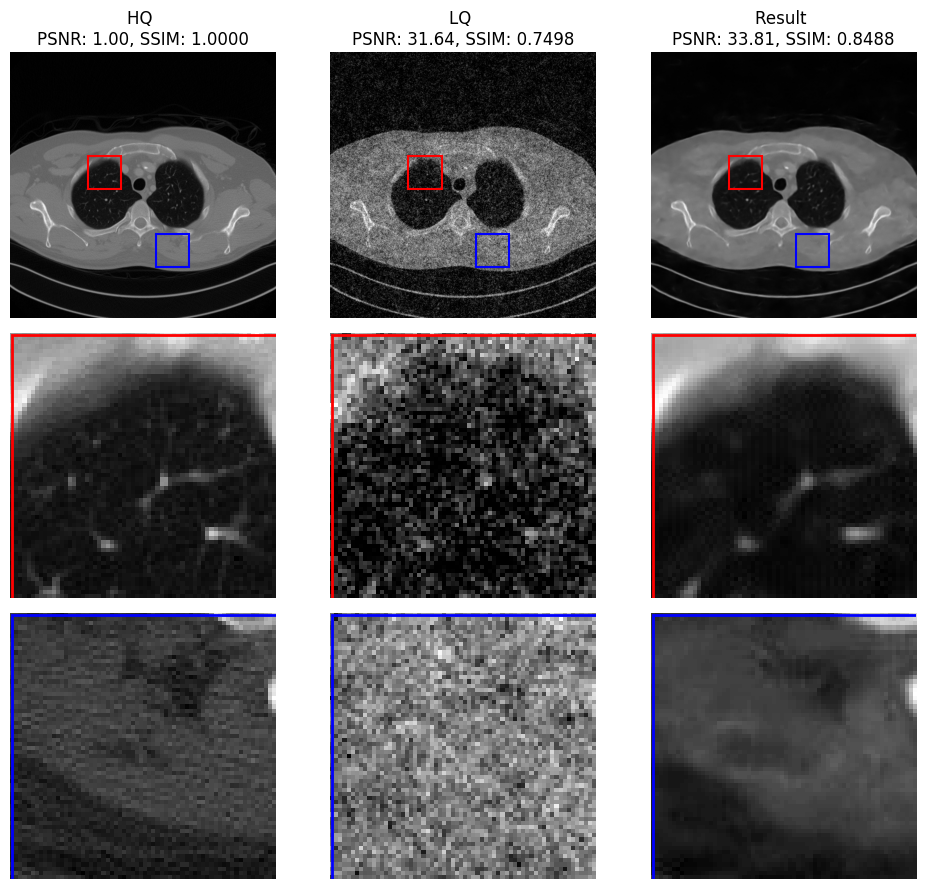

In [6]:
show_comparison(
    LQ_path = "/home/duongnhan/Chon/data/result_test/test_300_range3/level_30/gt/ID_0033_g4.jpg", 
    REDCNN_path = "/home/duongnhan/Chon/data/test_200/30/input/ID_0033_g4.jpg", 
    WGAN_path = "/home/duongnhan/Chon/data/result_test/test_300_range3/level_30/input/ID_0033_g4.jpg",
    zoom1_coords = (150, 200), 
    zoom2_coords = (280, 350), zoom_size=(64, 64))

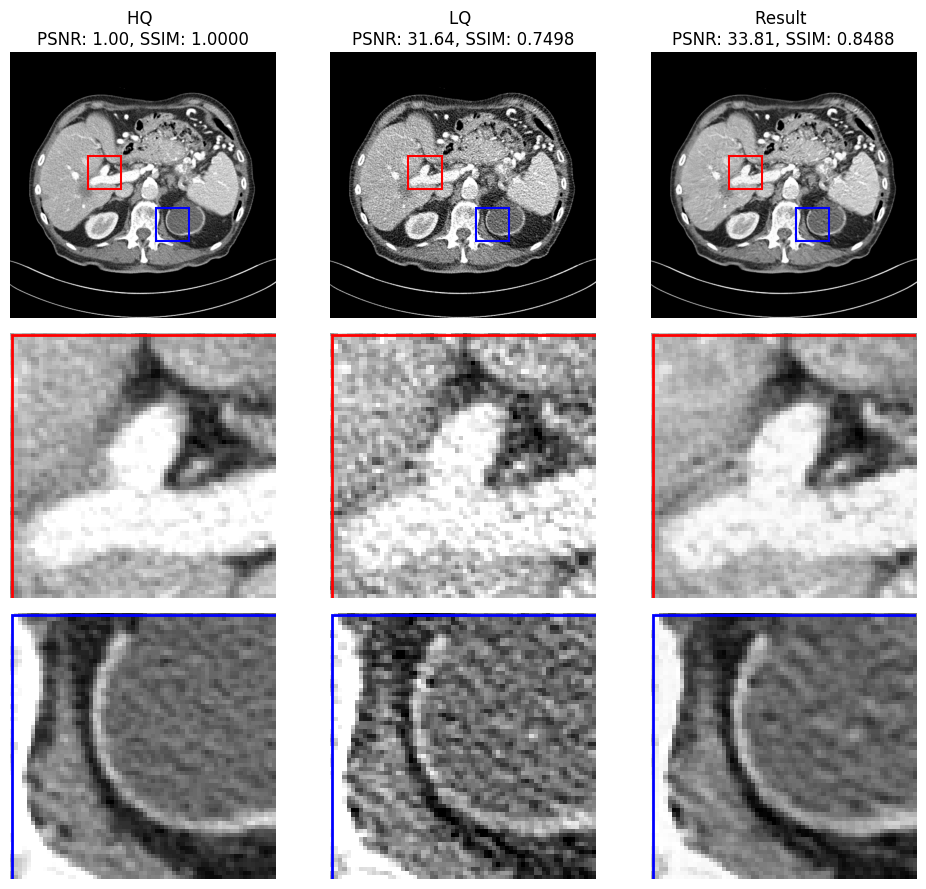

In [8]:
show_comparison(
    LQ_path = "/home/duongnhan/Chon/data/test/LDCT/L506/gt/L506_176.png", 
    REDCNN_path = "/home/duongnhan/Chon/data/test/LDCT/L506/input/L506_176.png", 
    WGAN_path = "/home/duongnhan/Chon/data/result_test/LDCT/L506/input/L506_176.png",
    zoom1_coords = (150, 200), 
    zoom2_coords = (280, 300), zoom_size=(64, 64))

In [19]:
import numpy as np
import cv2

def compute_rmse(img1_path, img2_path):
    # Đọc ảnh dưới dạng grayscale
    img1 = cv2.imread(img1_path, cv2.IMREAD_GRAYSCALE).astype(np.float32)
    img2 = cv2.imread(img2_path, cv2.IMREAD_GRAYSCALE).astype(np.float32)

    # Kiểm tra kích thước giống nhau
    if img1.shape != img2.shape:
        raise ValueError("Ảnh không cùng kích thước.")

    # Tính RMSE
    mse = np.mean((img1 - img2) ** 2)
    rmse = np.sqrt(mse)
    return rmse

# Ví dụ sử dụng
rmse_val = compute_rmse("/home/duongnhan/Chon/data/test/LDCT/L291/gt/ID_0052.png", "/home/duongnhan/Chon/data/result_test/LDCT/L291/input/ID_0052.png")
print(f"✅ RMSE: {rmse_val:.4f}")


✅ RMSE: 5.7752


In [20]:
rmse_val = compute_rmse("/home/duongnhan/Chon/data/test/LDCT/L291/gt/ID_0052.png", "/home/duongnhan/Chon/data/test/LDCT/L291/input/ID_0052.png")
print(f"✅ RMSE: {rmse_val:.4f}")


✅ RMSE: 5.1876


In [36]:
import os
import cv2
import matplotlib.pyplot as plt
from skimage.metrics import peak_signal_noise_ratio as psnr
from skimage.metrics import structural_similarity as ssim

def show_image_grid_with_metrics(folders, image_names, row_labels=None):
    """
    folders: list chứa đường dẫn đến 4 thư mục theo thứ tự [GT, Noisy, S1, S2]
    image_names: list tên 6 ảnh giống nhau trong mỗi thư mục
    row_labels: list tên hiển thị ở trục y
    """
    num_rows = len(folders)
    num_cols = len(image_names)

    if row_labels is None:
        row_labels = ['GT', 'Noisy', 'S1', 'S2']

    fig, axs = plt.subplots(num_rows, num_cols, figsize=(3 * num_cols, 3 * num_rows), constrained_layout=False)

    for row, folder in enumerate(folders):
        for col, img_name in enumerate(image_names):
            img_path = os.path.join(folder, img_name)
            img = cv2.imread(img_path, cv2.IMREAD_GRAYSCALE)

            ref_path = os.path.join(folders[0], img_name)
            ref_img = cv2.imread(ref_path, cv2.IMREAD_GRAYSCALE)

            if row == 0:
                psnr_val, ssim_val = 1.0, 1.0
                title = "Ground Truth"
            else:
                psnr_val = psnr(ref_img, img, data_range=255)
                ssim_val = ssim(ref_img, img, data_range=255)
                title = f"PSNR: {psnr_val:.2f}\nSSIM: {ssim_val:.4f}"

            ax = axs[row, col]
            ax.imshow(img, cmap='gray')
            ax.axis('off')

            # Tiêu đề cột trên cùng (tên ảnh không có đuôi)
            if row == 0:
                name_without_ext = os.path.splitext(img_name)[0]
                ax.set_title(f"{name_without_ext}\n{title}", fontsize=9)
            else:
                ax.set_title(title, fontsize=8)

            # Nhãn hàng bên trái
            if col == 0:
                ax.annotate(row_labels[row],
                            xy=(0, 0.5),
                            xytext=(-ax.yaxis.labelpad - 30, 0),
                            xycoords=ax.yaxis.label,
                            textcoords='offset points',
                            size='large',
                            ha='right',
                            va='center',
                            rotation=90,
                            weight='bold')

    # Tạo khoảng trống bên trái để không bị cắt label
    fig.subplots_adjust(left=0.13, wspace=0.3, hspace=0.4)
    plt.show()


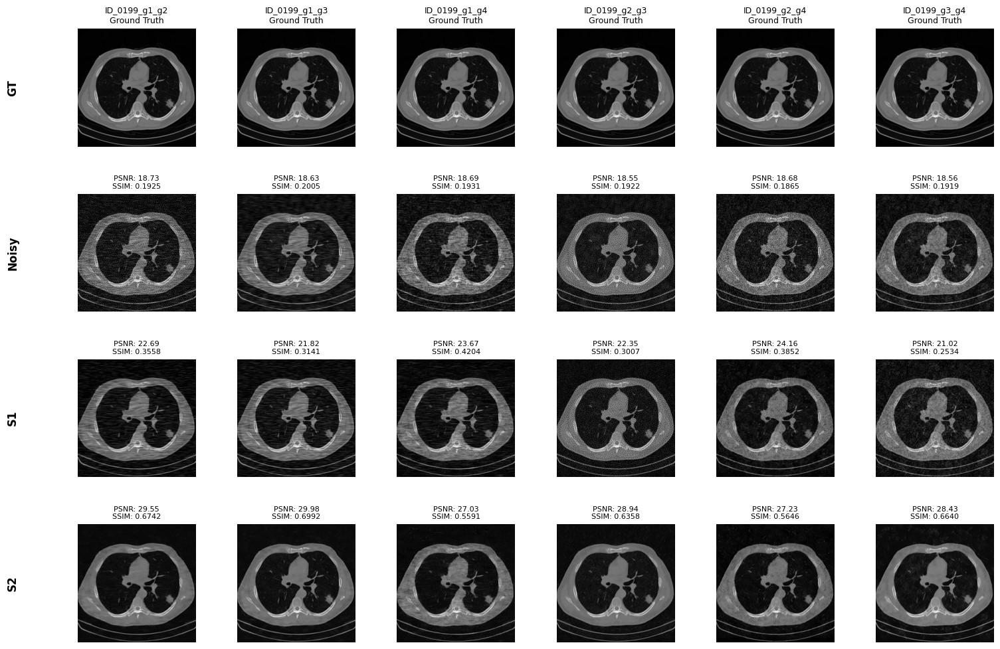

In [37]:
val_data_dir='/home/duongnhan/Chon/data/test/test_2/'
val_filename='CT.txt'
save_path1 = '/home/duongnhan/Chon/data/result_test/test_12/lan1/'
save_path2 = '/home/duongnhan/Chon/data/result_test/test_12/lan2/'

folders = [
    "/home/duongnhan/Chon/data/test/test_2/gt/",     # Hàng 1
    "/home/duongnhan/Chon/data/test/test_2/input/",        # Hàng 2
    "/home/duongnhan/Chon/data/result_test/test_12/lan1/input/",      # Hàng 3
    "/home/duongnhan/Chon/data/result_test/test_12/lan3/input/"       # Hàng 4
]

image_names = [
    "ID_0199_g1_g2.jpg",
    "ID_0199_g1_g3.jpg",
    "ID_0199_g1_g4.jpg",
    "ID_0199_g2_g3.jpg",
    "ID_0199_g2_g4.jpg",
    "ID_0199_g3_g4.jpg"
]

show_image_grid_with_metrics(folders, image_names)


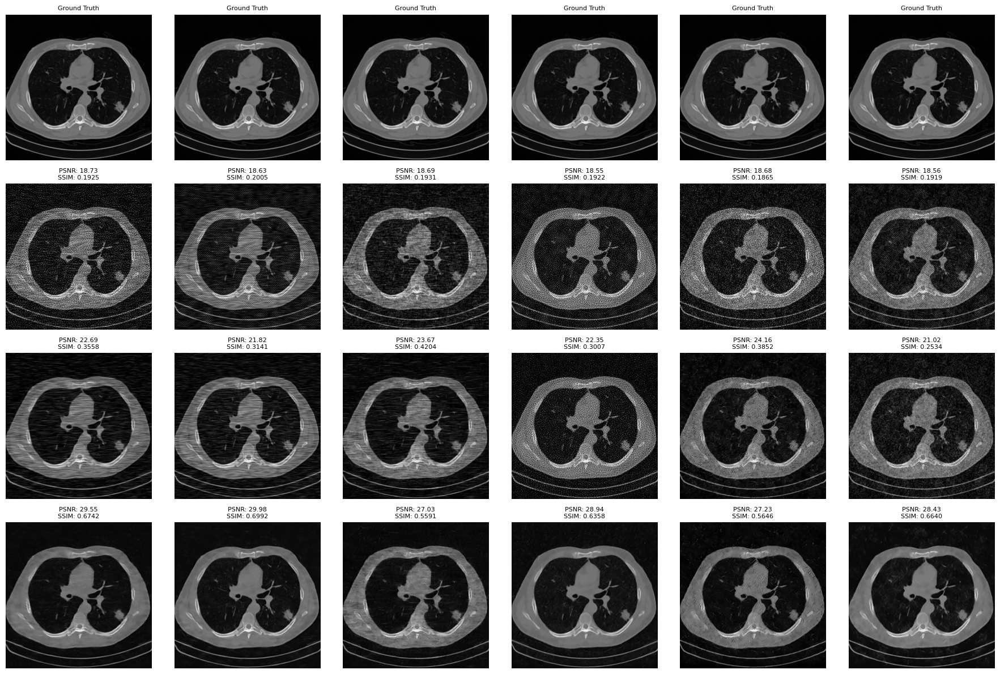

In [29]:
row_labels = ["Ground Truth", "Noisy", "S1", "S2"]

show_image_grid_with_metrics(folders, image_names, row_labels)


In [41]:
import os
import cv2
import matplotlib.pyplot as plt
from matplotlib.patches import Rectangle
from skimage.metrics import peak_signal_noise_ratio as psnr
from skimage.metrics import structural_similarity as ssim

def crop_zoom_region(image, top_left, size):
    """Cắt một vùng từ ảnh."""
    x, y = top_left
    h, w = size
    return image[y:y+h, x:x+w]

def show_single_image_with_zoom(folders, image_name, zoom1_coords, zoom2_coords,
                                zoom_size=(64, 64), method_labels=None):
    """
    folders: list thư mục [GT, Noisy, S1, S2]
    image_name: tên ảnh cần hiển thị
    zoom1_coords: (x, y) vùng zoom 1 (ví dụ mô mềm)
    zoom2_coords: (x, y) vùng zoom 2 (ví dụ biên sắc nét)
    """
    num_methods = len(folders)
    if method_labels is None:
        method_labels = ['GT', 'Noisy', 'S1', 'S2']

    fig, axs = plt.subplots(3, num_methods, figsize=(4*num_methods, 10))
    zoom_coords = [zoom1_coords, zoom2_coords]
    zoom_colors = ['red', 'blue']

    ref_path = os.path.join(folders[0], image_name)
    ref_img = cv2.imread(ref_path, cv2.IMREAD_GRAYSCALE)

    for i, folder in enumerate(folders):
        img_path = os.path.join(folder, image_name)
        img = cv2.imread(img_path, cv2.IMREAD_GRAYSCALE)

        # PSNR/SSIM
        if i == 0:
            psnr_val, ssim_val = 1.0, 1.0
            title = "Ground Truth"
        else:
            psnr_val = psnr(ref_img, img, data_range=255)
            ssim_val = ssim(ref_img, img, data_range=255)
            title = f"PSNR: {psnr_val:.2f}\nSSIM: {ssim_val:.4f}"

        # Hàng 0: ảnh gốc + vùng zoom
        axs[0, i].imshow(img, cmap='gray')
        axs[0, i].set_title(f"{method_labels[i]}\n{title}", fontsize=10)
        axs[0, i].axis('off')

        # Vẽ 2 khung zoom
        for idx, (x, y) in enumerate(zoom_coords):
            rect = Rectangle((x, y), zoom_size[0], zoom_size[1],
                             edgecolor=zoom_colors[idx], facecolor='none', linewidth=1.5)
            axs[0, i].add_patch(rect)

        # Hàng 1 & 2: vùng zoom
        for j in range(2):
            zoom_img = crop_zoom_region(img, zoom_coords[j], zoom_size)
            axs[j+1, i].imshow(zoom_img, cmap='gray')
            axs[j+1, i].axis('off')

            # Vẽ khung viền cùng màu với zoom
            axs[j+1, i].add_patch(Rectangle(
                (0, 0), zoom_img.shape[1], zoom_img.shape[0],
                edgecolor=zoom_colors[j], facecolor='none', linewidth=2
            ))

    plt.tight_layout()
    plt.show()


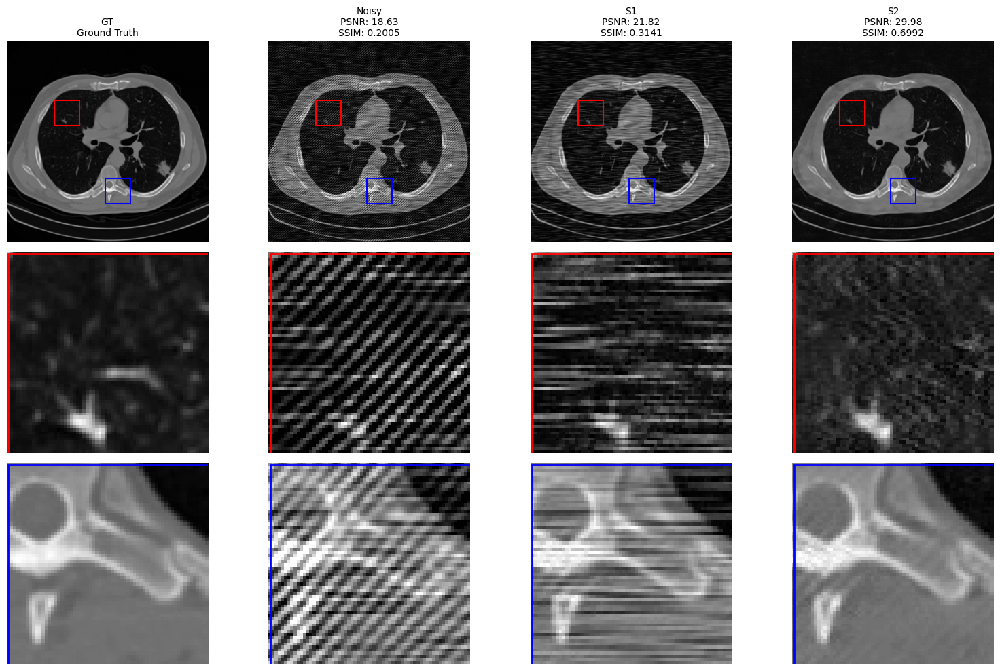

In [42]:
folders = [
    "/home/duongnhan/Chon/data/test/test_2/gt/",     # Hàng 1
    "/home/duongnhan/Chon/data/test/test_2/input/",        # Hàng 2
    "/home/duongnhan/Chon/data/result_test/test_12/lan1/input/",      # Hàng 3
    "/home/duongnhan/Chon/data/result_test/test_12/lan3/input/"       # Hàng 4
]
image_name = "ID_0199_g1_g3.jpg"
method_labels = ["GT", "Noisy", " S1", "S2"]

zoom1_coords = (120, 150)   # mô mềm
zoom2_coords = (250, 350)   # biên sắc nét

show_single_image_with_zoom(folders, image_name, zoom1_coords, zoom2_coords)


In [34]:
import os
import cv2
import matplotlib.pyplot as plt
from skimage.metrics import peak_signal_noise_ratio as psnr
from skimage.metrics import structural_similarity as ssim

def show_image_grid_with_metrics(folders, image_names, row_labels=None):
    num_rows = len(folders)
    num_cols = len(image_names)

    if row_labels is None:
        row_labels = [f"Row {i+1}" for i in range(num_rows)]

    fig, axs = plt.subplots(num_rows, num_cols, figsize=(3*num_cols, 3*num_rows), constrained_layout=False)

    for row, folder in enumerate(folders):
        for col, img_name in enumerate(image_names):
            img_path = os.path.join(folder, img_name)
            img = cv2.imread(img_path, cv2.IMREAD_GRAYSCALE)

            ref_path = os.path.join(folders[0], img_name)
            ref_img = cv2.imread(ref_path, cv2.IMREAD_GRAYSCALE)

            if row == 0:
                psnr_val, ssim_val = 1.0, 1.0
                title = "Ground Truth"
            else:
                psnr_val = psnr(ref_img, img, data_range=255)
                ssim_val = ssim(ref_img, img, data_range=255)
                title = f"PSNR: {psnr_val:.2f}\nSSIM: {ssim_val:.4f}"

            ax = axs[row, col]
            ax.imshow(img, cmap='gray')
            ax.axis('off')

            # Tên ảnh (không phần mở rộng) hiển thị ở hàng đầu
            if row == 0:
                name_without_ext = os.path.splitext(img_name)[0]
                ax.set_title(f"{name_without_ext}\n{title}", fontsize=9)
            else:
                ax.set_title(title, fontsize=8)

            # Gắn nhãn hàng bên trái
            if col == 0:
                ax.annotate(row_labels[row], xy=(0, 0.5), xytext=(-ax.yaxis.labelpad - 25, 0),
                            xycoords=ax.yaxis.label, textcoords='offset points',
                            size='large', ha='right', va='center', weight='bold', rotation=90)

    # Tạo khoảng trống bên trái để row_labels không bị cắt
    fig.subplots_adjust(left=0.12, wspace=0.3, hspace=0.4)
    plt.show()


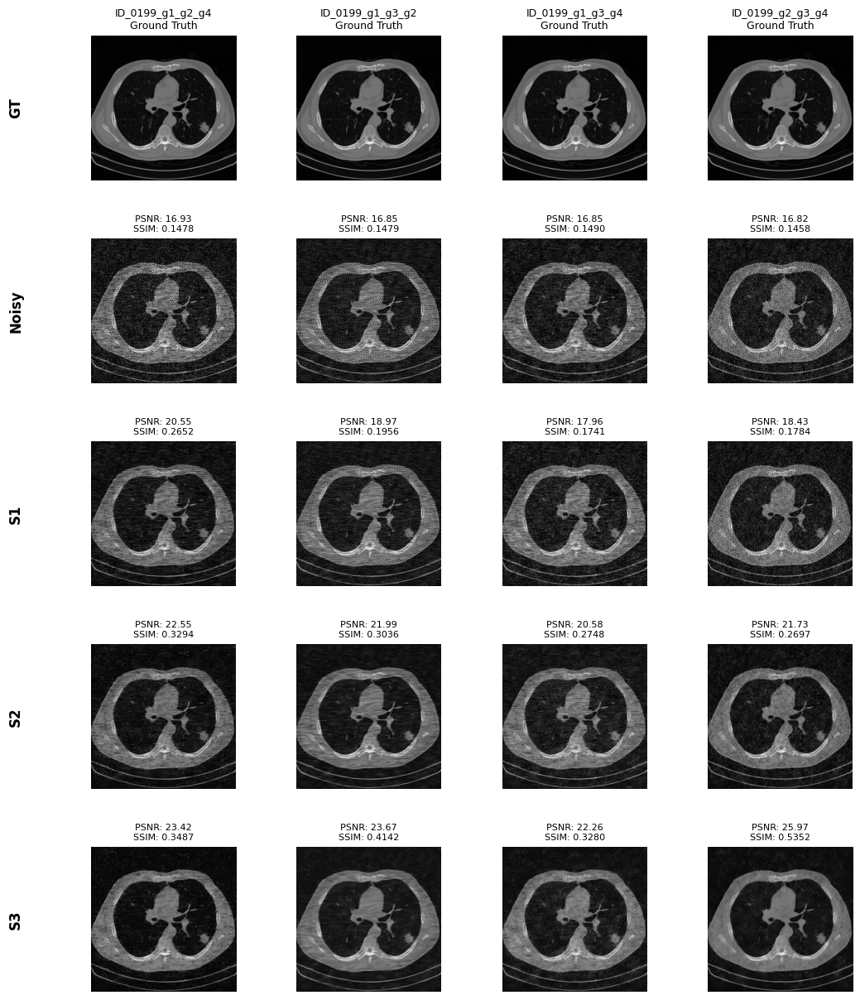

In [35]:
folders = [
    "/home/duongnhan/Chon/data/test/test_3/gt/",     # Hàng 1
    "/home/duongnhan/Chon/data/test/test_3/input/",        # Hàng 2
    "/home/duongnhan/Chon/data/result_test/test_123/lan1/input/",      
    "/home/duongnhan/Chon/data/result_test/test_123/lan2/input/",   
    "/home/duongnhan/Chon/data/result_test/test_123/lan4/input/"       
]

image_names = [
    "ID_0199_g1_g2_g4.jpg",
    "ID_0199_g1_g3_g2.jpg",
    "ID_0199_g1_g3_g4.jpg",
    "ID_0199_g2_g3_g4.jpg"
]

row_labels = ["GT", "Noisy", "S1", "S2", "S3"]

show_image_grid_with_metrics(folders, image_names, row_labels)


In [43]:
import os
import cv2
import matplotlib.pyplot as plt
from matplotlib.patches import Rectangle
from skimage.metrics import peak_signal_noise_ratio as psnr
from skimage.metrics import structural_similarity as ssim

def crop_zoom_region(image, top_left, size):
    """Cắt một vùng từ ảnh."""
    x, y = top_left
    h, w = size
    return image[y:y+h, x:x+w]

def show_single_image_with_zoom(folders, image_name, zoom1_coords, zoom2_coords,
                                zoom_size=(64, 64), method_labels=None):
    """
    folders: list thư mục [GT, Noisy, S1, S2, S3]
    image_name: tên ảnh cần hiển thị
    zoom1_coords: (x, y) vùng zoom 1
    zoom2_coords: (x, y) vùng zoom 2
    """
    num_methods = len(folders)
    if method_labels is None:
        method_labels = ['GT', 'Noisy', 'S1', 'S2', 'S3']

    fig, axs = plt.subplots(3, num_methods, figsize=(4 * num_methods, 10))
    zoom_coords = [zoom1_coords, zoom2_coords]
    zoom_colors = ['red', 'blue']

    ref_path = os.path.join(folders[0], image_name)
    ref_img = cv2.imread(ref_path, cv2.IMREAD_GRAYSCALE)

    for i, folder in enumerate(folders):
        img_path = os.path.join(folder, image_name)
        img = cv2.imread(img_path, cv2.IMREAD_GRAYSCALE)

        # PSNR/SSIM
        if i == 0:
            psnr_val, ssim_val = 1.0, 1.0
            title = "Ground Truth"
        else:
            psnr_val = psnr(ref_img, img, data_range=255)
            ssim_val = ssim(ref_img, img, data_range=255)
            title = f"PSNR: {psnr_val:.2f}\nSSIM: {ssim_val:.4f}"

        # Hàng 0: ảnh gốc + khung zoom
        axs[0, i].imshow(img, cmap='gray')
        axs[0, i].set_title(f"{method_labels[i]}\n{title}", fontsize=10)
        axs[0, i].axis('off')

        for idx, (x, y) in enumerate(zoom_coords):
            rect = Rectangle((x, y), zoom_size[0], zoom_size[1],
                             edgecolor=zoom_colors[idx], facecolor='none', linewidth=1.5)
            axs[0, i].add_patch(rect)

        # Hàng 1 & 2: ảnh zoom
        for j in range(2):
            zoom_img = crop_zoom_region(img, zoom_coords[j], zoom_size)
            axs[j+1, i].imshow(zoom_img, cmap='gray')
            axs[j+1, i].axis('off')
            axs[j+1, i].add_patch(Rectangle(
                (0, 0), zoom_img.shape[1], zoom_img.shape[0],
                edgecolor=zoom_colors[j], facecolor='none', linewidth=2
            ))

    plt.tight_layout()
    plt.show()


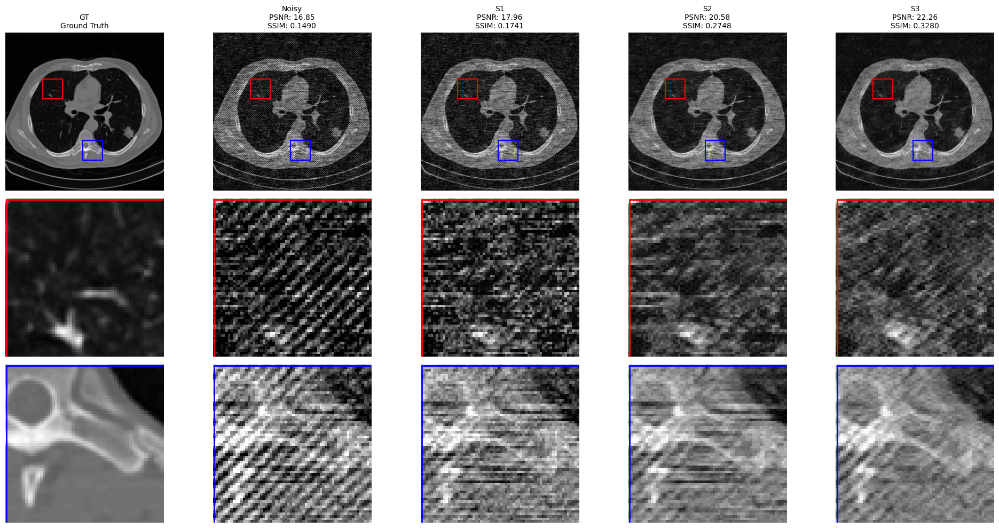

In [ ]:
folders = [
    "/home/duongnhan/Chon/data/test/test_3/gt/",     # Hàng 1
    "/home/duongnhan/Chon/data/test/test_3/input/",        # Hàng 2
    "/home/duongnhan/Chon/data/result_test/test_123/lan1/input/",      
    "/home/duongnhan/Chon/data/result_test/test_123/lan2/input/",   
    "/home/duongnhan/Chon/data/result_test/test_123/lan4/input/"       
]
image_name = "ID_0199_g1_g3_g4.jpg"
image_name2 = "ID_0199_g1_g2_g4.jpg"
image_name3 = "ID_0199_g1_g3_g2.jpg"
image_name4 = "ID_0199_g2_g3_g4.jpg"

zoom1_coords = (120, 150)   # mô mềm
zoom2_coords = (250, 350)   # biên sắc nét

show_single_image_with_zoom(folders, image_name, zoom1_coords, zoom2_coords)


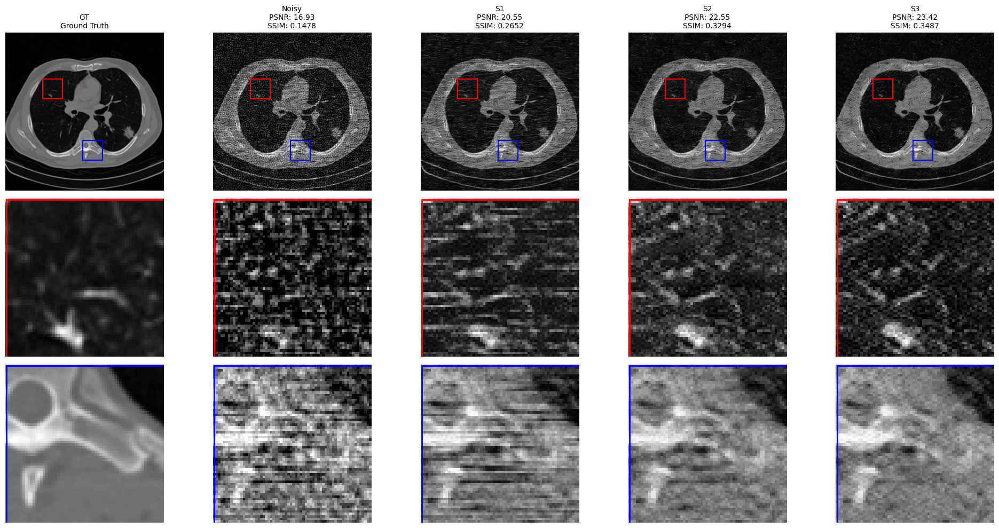

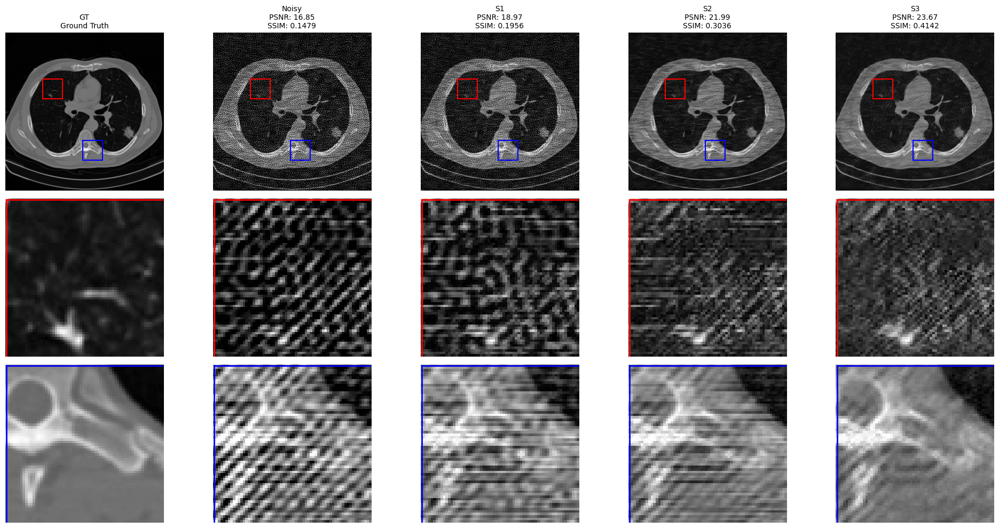

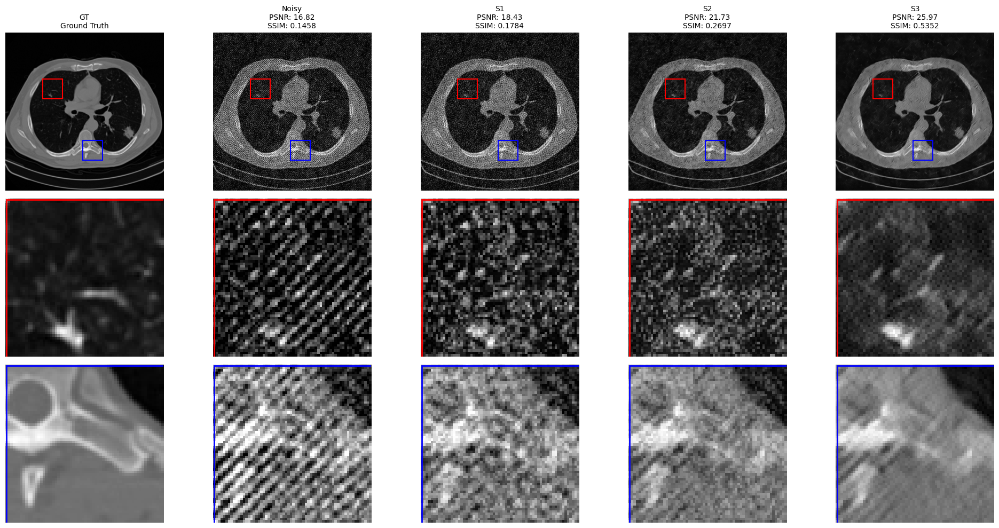

In [45]:
image_name = "ID_0199_g1_g3_g4.jpg"
image_name2 = "ID_0199_g1_g2_g4.jpg"
image_name3 = "ID_0199_g1_g3_g2.jpg"
image_name4 = "ID_0199_g2_g3_g4.jpg"

zoom1_coords = (120, 150)   # mô mềm
zoom2_coords = (250, 350)   # biên sắc nét

show_single_image_with_zoom(folders, image_name2, zoom1_coords, zoom2_coords)
show_single_image_with_zoom(folders, image_name3, zoom1_coords, zoom2_coords)
show_single_image_with_zoom(folders, image_name4, zoom1_coords, zoom2_coords)